# Fitting COSMOS sources with Gaussian models: HST vs HSC

This notebook plots results from fitting sources from the COSMOS field (http://cosmos.astro.caltech.edu/), using imaging from the Hyper-Suprime Cam (HSC) Subaru Strategic Program (SSP, https://hsc-release.mtk.nao.ac.jp/doc/) UltraDeep i- and z-bands, as well as Hubble Space Telescope imaging in F814W, which covers approximately the same wavelengths. Fit parameters are from Gaussian models fit with MultiProFit (https://github.com/lsst-dm/multiprofit). For the moment, the HST Gaussian models and their parameters are *not* PSF-convolved; this is partly to test whether one can a) identify unresolved sources and b) determine the PSF by fitting them, all before fitting any PSF-convolved models. There is an advantage that this allows for objects smaller than the nominal PSF size.

Brief conclusions:
- One could use single Gaussian fits in HSC and HST to morphologically identify point sources; however, it would be dangerous to do so on an inconsistent coadd (one with discontinuous PSFs due to e.g. inconsistent per-visit masks);
- The base_ClassificationExtendedness_value does not do very well at identifying i>23 point sources (it wasn't really designed to);
- There is a reasonable, mostly magnitude-independent between HSC-[I+Z] and HST-F814W fluxes, but the scatter is large and calibrating with colour terms may not be trivial.

In [1]:
# Import requirements
from astropy.table import vstack
from astropy.visualization import make_lupton_rgb
import glob
from lsst.afw.table import SourceCatalog
from lsst.daf.persistence import Butler
from lsst.geom import degrees, Point2D
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from modelling_research.make_cutout import get_exposure_cutout_HST, get_exposures_HST_COSMOS, get_tiles_overlapping_HST, get_tiles_HST_COSMOS
from lsst.meas.extensions.multiprofit.fit_multiband import MultiProFitTask
from modelling_research.plotting import plotjoint_running_percentiles
import numpy as np
import os
import seaborn as sns
from timeit import default_timer as timer

rad2deg = 180/np.pi

In [2]:
# Setup for plotting
%matplotlib inline
sns.set_style('darkgrid')
mpl.rcParams['figure.dpi'] = 160
mpl.rcParams['image.origin'] = 'lower'
sns.set(rc={'axes.facecolor': '0.85', 'figure.facecolor': 'w'})

argspj = dict(
    percentiles = [5, 16, 50, 84, 95],
    percentilecolours = [(0.4, 0.6, 0.9), (0.3, 0.45, 0.6), (0.3, 0.3, 0.3), (0.3, 0.45, 0.6), (0.4, 0.6, 0.9)],
    scatterleft = True,
    scatterright = True,
)

In [3]:
# Class for subplot jointgrids stolen shamelessly from https://stackoverflow.com/questions/35042255/how-to-plot-multiple-seaborn-jointplot-in-subplot
class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())

In [4]:
# Read catalogs
path_proj = "/project/dtaranu/cosmos/hsc/"
files = np.sort(glob.glob(f"{path_proj}2020-04-06/iz/mpf_cosmos-hsc_iz_9813_[1-7],[1-7]_mag.fits"))
tables = []
patches = []
patch_rows = []
rows = 0
for file in files:
    t_begin = timer()
    print(f'Loading file {file}')
    table = SourceCatalog.readFits(file).asAstropy()
    print(f'Loaded file {file} in {timer() - t_begin:.2f}s')
    tables.append(table)
    rows += len(table)
    patch_rows.append(rows)
    patches.append(os.path.split(file)[1].split('_')[4])
cat = vstack(tables)

Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,1_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,1_mag.fits in 3.26s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,2_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,2_mag.fits in 4.72s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,3_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,3_mag.fits in 4.64s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,4_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,4_mag.fits in 3.39s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,5_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_1,5_mag.fits in 3.07s
Loading file /project/dtaranu/cosmos/hsc/2020-04-0

Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,2_mag.fits in 4.08s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,3_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,3_mag.fits in 5.52s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,4_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,4_mag.fits in 6.16s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,5_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,5_mag.fits in 4.84s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,6_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,6_mag.fits in 4.93s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06

In [5]:
# Read HST catalogs
colnames_mpf = None
cat_hst = []
for patch in patches:
    t_begin = timer()
    print(f'Loading file {file}')
    cat_patch = SourceCatalog.readFits(os.path.join(path_proj,'2020-01-15','hst_F814W_iso',f'mpf_F814W_iso_9813_{patch}.fits')).asAstropy()
    print(f'Loaded file {file} in {timer() - t_begin:.2f}s')
    if colnames_mpf is None:
        colnames = cat_patch.colnames
        idx_col_mpf = np.where([x.startswith('multiprofit') for x in colnames])[0][0]
        colnames_mpf = colnames[idx_col_mpf:]
    cat_hst.append(cat_patch[colnames_mpf])
cat_hst = vstack(cat_hst)

Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 2.83s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 2.96s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 3.10s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 4.79s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 3.54s
Loading file /project/dtaranu/cosmos/hsc/2020-04-0

Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 3.75s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 3.63s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 4.72s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 3.79s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits in 2.96s
Loading file /project/dtaranu/cosmos/hsc/2020-04-06/iz/mpf_cosmos-hsc_iz_9813_7,7_mag.fits
Loaded file /project/dtaranu/cosmos/hsc/2020-04-06

## Gaussian fits

This section makes three sets of plots for a couple of very broad magnitude bins:

- ellipse x_50_x vs y_50 for parent+isolated sources vs just isolated sources, and for extended vs unresolved sources. Isolated, unresolved sources should be mostly stars that are safe to use for PSF fitting, although some in HSC may be small, high-z galaxies.
- r_50 and flux for HST vs HSC. Since the HSC model is PSF-convolved, its size should match (with some scatter) the HST sizes reasonably well. Although the HST sizes are not PSF de-convolved, they asymptote to the (very small) PSF size. Similarly, the good match between HSC I+Z filters and HST F814W means those fluxes should match reasonably well modulo some constant unit/calibration factor.
- A plot of the positions of isolated, unresolved sources (PSF fit candidates), scaled by their magnitude.

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in less
  result = getattr(super(), op)(other)
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in log10
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: divide by zero encountered in log10


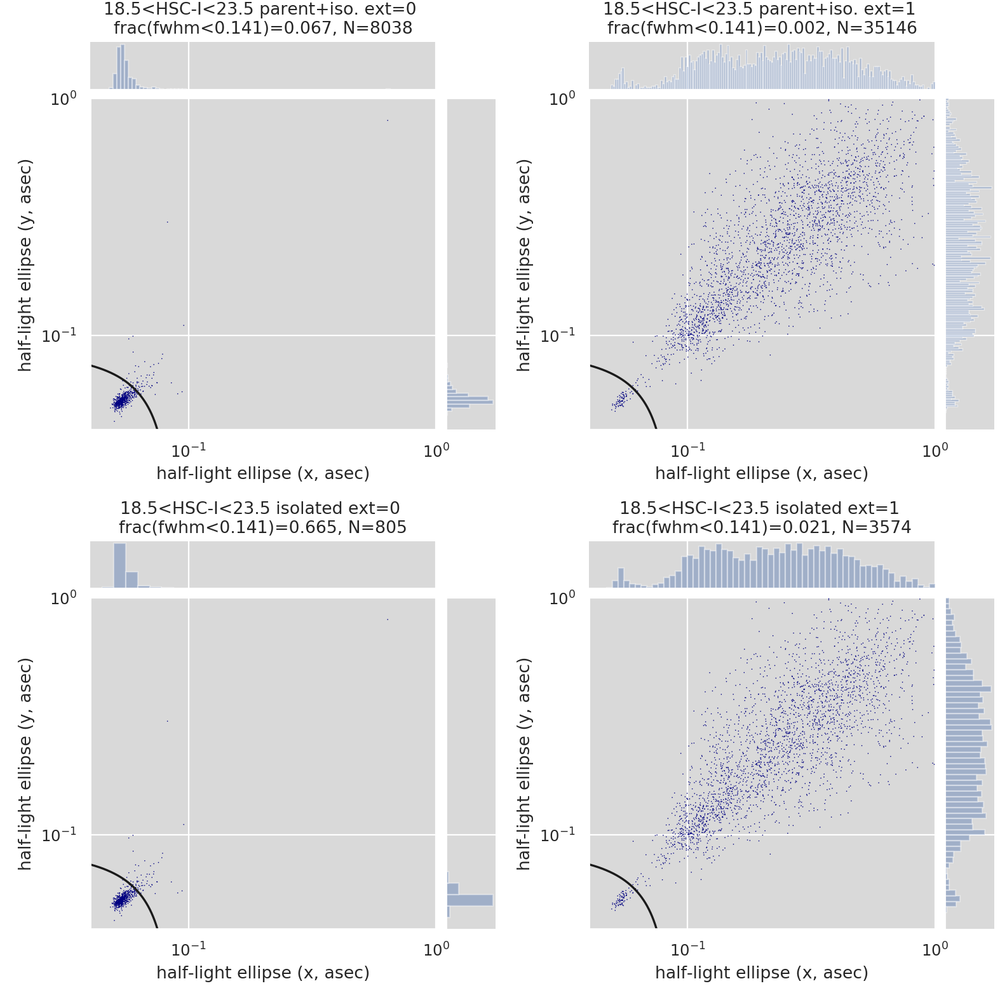

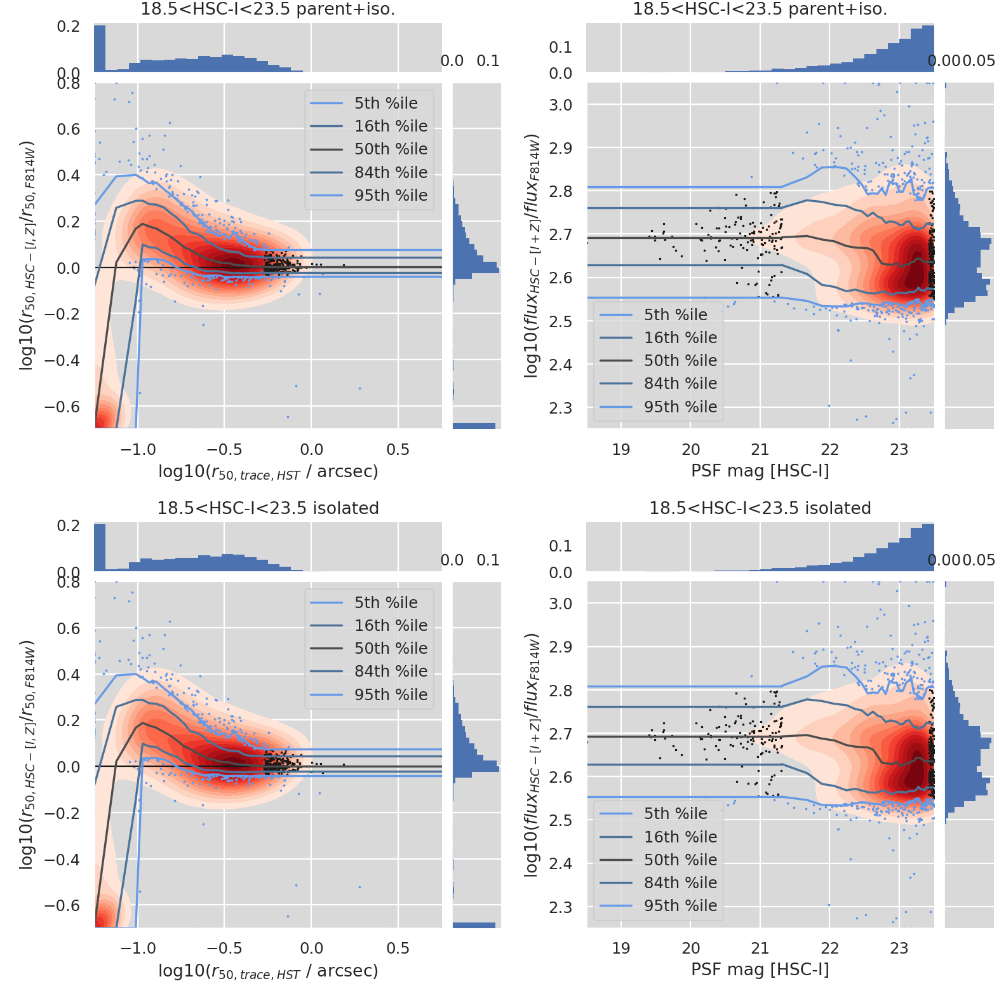

<Figure size 1920x1920 with 0 Axes>

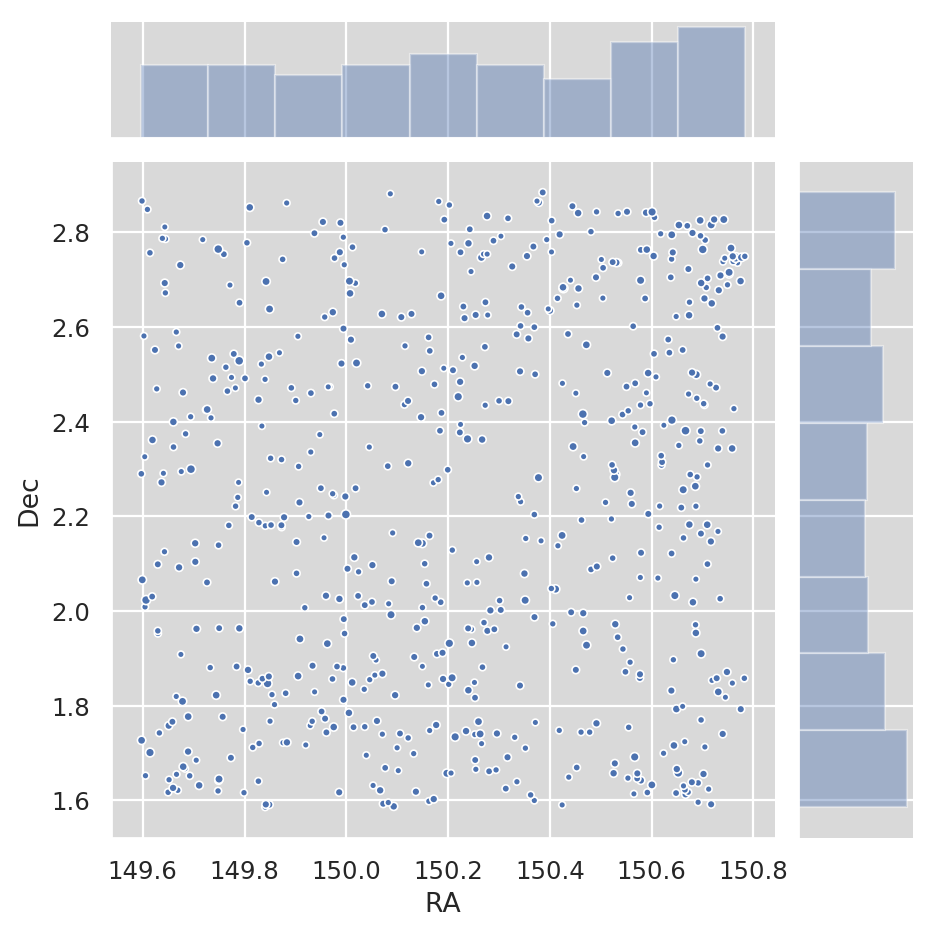

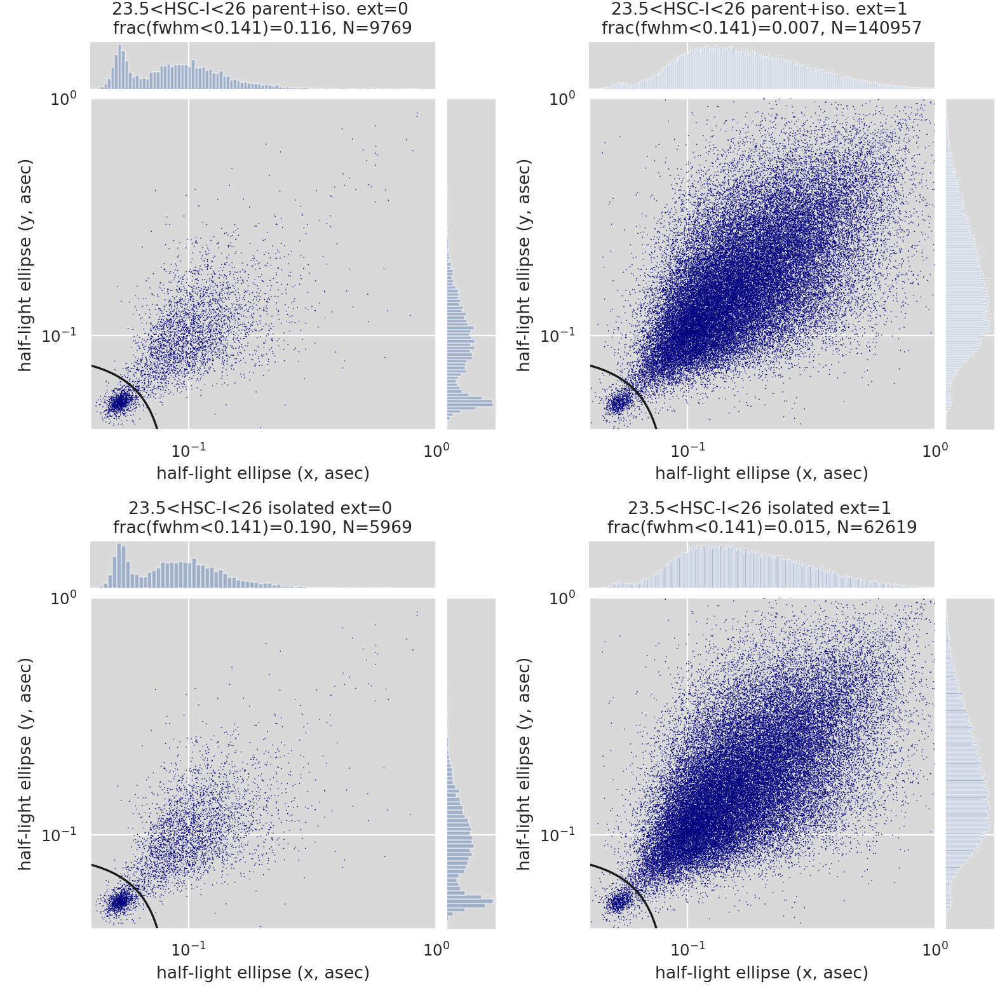

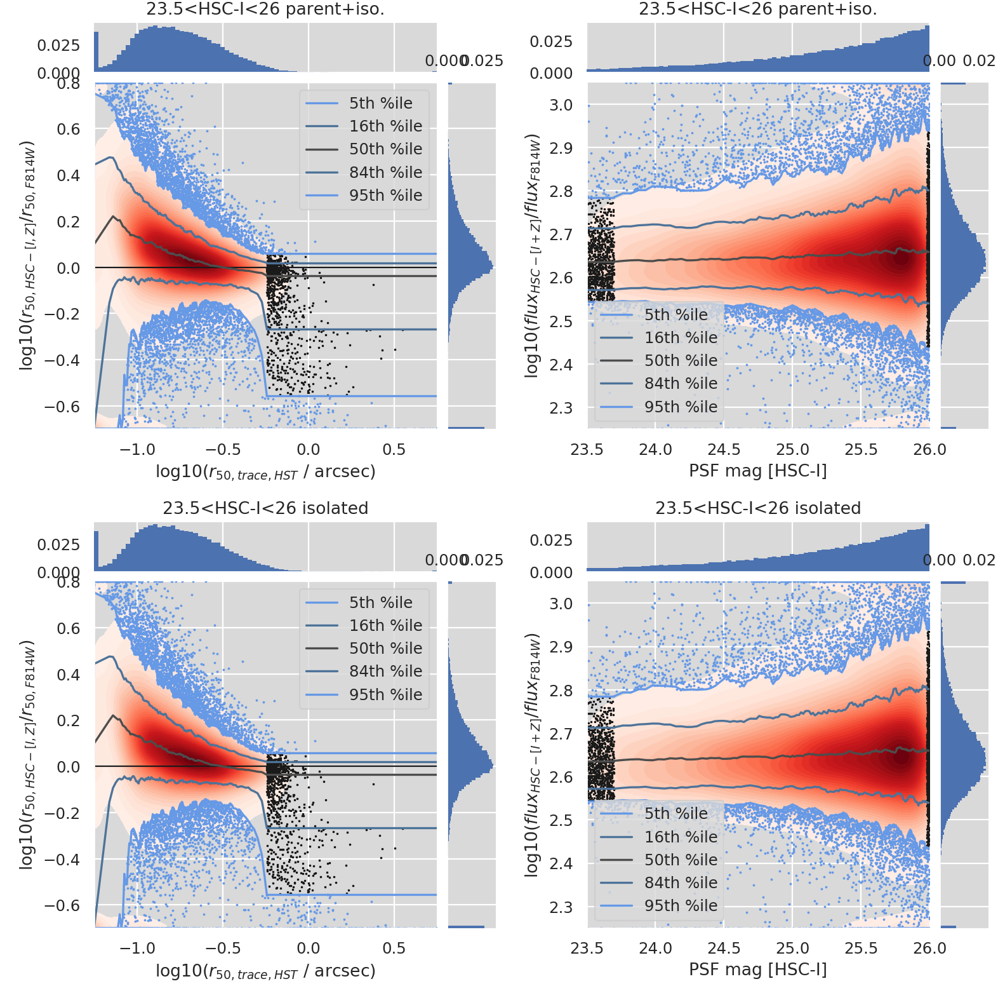

<Figure size 1920x1920 with 0 Axes>

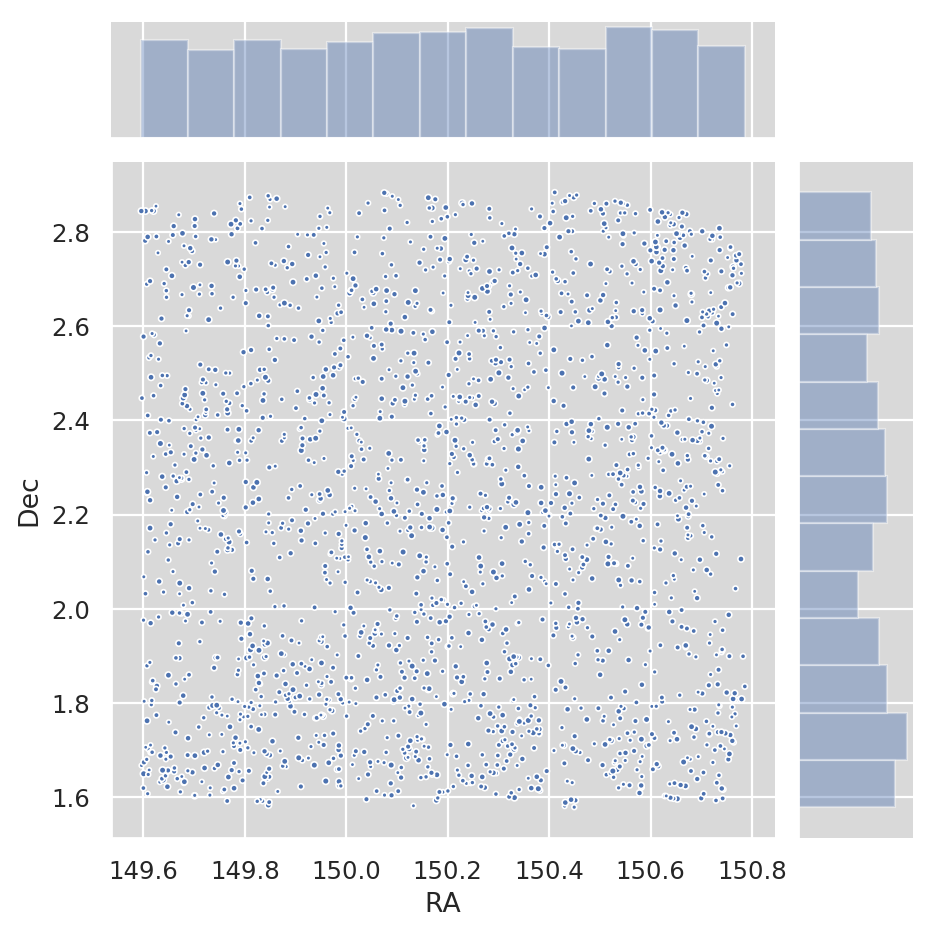

In [6]:
# Get a WCS from one of the calexps (i- and z-band should be virtually identical)
col_extended = 'base_ClassificationExtendedness_value'

def name_flux(is_hsc):
    return 'instFlux' if is_hsc else 'flux'

sample = {'parent+iso.': (cat['parent'] == 0) & cat['detect_isPatchInner']}
sample['isolated'] = sample['parent+iso.'] & (cat['deblend_nChild'] == 0)
sample_ext = {f'extended_{i}': cat[col_extended] == i for i in range(2)}
sigma_min = 0.04
sigma_max = 0.06
lims_sigma = (sigma_min, 1)
lims_sigma_log10 = np.log10(lims_sigma)
sigma_max_sq = sigma_max**2
sigma_plot = np.linspace(sigma_min, sigma_max, 100) 
sigma_plot_x = np.append(sigma_plot, np.flip(np.sqrt(2*sigma_max_sq - sigma_plot**2), 0)[1:]) 
sigma_plot_y = np.flip(sigma_plot_x, 0)

mag_bins = [(18.5, 23.5), (23.5, 26)]
for mag_lo, mag_hi in mag_bins: 
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(2, 2, wspace=.2)
    fig_sizemass = plt.figure(figsize=(10, 10))
    gs_sizemass = gridspec.GridSpec(2, 2, wspace=.2)
    select_mag = (cat['base_PsfFlux_mag'] > mag_lo) & (cat['base_PsfFlux_mag'] < mag_hi) & ~(cat['base_PixelFlags_flag_saturated'])
    for idx_state, (state, sample_iso) in enumerate(sample.items()): 
        selection = sample_iso & select_mag
        title_state = f'{mag_lo}<HSC-I<{mag_hi} {state}'
        for idx in range(2):
            data = cat_hst[selection & sample_ext[f'extended_{idx}']]
            sigma = {k: data[f'multiprofit_gausspx_no_psf_c1_sigma_{k}']*0.03 for k in ['x', 'y']} 
            g = sns.JointGrid(x=sigma['x'], y=sigma['y'], xlim=lims_sigma, ylim=lims_sigma)
            g.set_axis_labels('half-light ellipse (x, asec)', 'half-light ellipse (y, asec)')
            g = g.plot_joint(sns.scatterplot, s=2, marker='.', facecolor='navy', edgecolor='none')
            g = g.plot_marginals(sns.distplot, kde=False, bins=np.logspace(
                lims_sigma_log10[0], lims_sigma_log10[1], np.int(np.ceil(np.sqrt(len(sigma['x'])))) + 1))
            ax = g.ax_joint
            ax.set_xscale('log')
            ax.set_yscale('log')
            ax.plot(sigma_plot_x, sigma_plot_y, 'k-') 
            within = np.sum(sigma['x'] * sigma['y'] < sigma_max_sq)
            g.ax_marg_x.set_xscale('log')
            g.ax_marg_y.set_yscale('log')
            g.ax_marg_x.set_title(f'{title_state} ext={idx} \nfrac(fwhm<{2*1.17741*sigma_max:0.3f})={within/len(sigma["x"]):0.3f}, N={len(data)}')
            SeabornFig2Grid(g, fig, gs[2*idx_state + idx])
        sigma_sample = []
        flux_sample = []
        lims_sigma_sample_log10 = [-1.25, 0.75]
        for idx, (scale, sample_src) in enumerate([(0.03, cat_hst), (0.167, cat)]):
            is_hst = idx == 0
            name_model = f'multiprofit_gausspx{"_no_psf" if is_hst else ""}'
            sample_src = sample_src[selection]
            sigma = {k: sample_src[f'{name_model}_c1_sigma_{k}'] for k in ['x', 'y']}
            sigma = scale*np.sqrt(0.5*(sigma['x']**2 + sigma['y']**2))
            sigma_sample.append(np.log10(sigma))
            bands = ['F814W'] if is_hst else ['HSC-I', 'HSC-Z']
            flux_band = {band: sample_src[f'{name_model}_c1_{band}_{name_flux(is_hst)}'] for band in bands}
            flux = np.zeros_like(sigma)
            for flux_band in flux_band.values():
                flux += flux_band
            flux[~(flux > 0)] = 0
            flux_sample.append(np.log10(flux))
        limx, limy = lims_sigma_sample_log10, (-0.7, 0.8)
        good = np.isfinite(sigma_sample[0]) & np.isfinite(sigma_sample[1])
        x = np.clip(sigma_sample[0][good], limx[0], limx[1])
        y = np.clip(sigma_sample[1][good]-sigma_sample[0][good], limy[0], limy[1])
        g = plotjoint_running_percentiles(
            x, y, limx=limx, limy=limy, labelx='log10($r_{50,trace,HST}$ / arcsec)', labely='log10($r_{50,HSC-[I,Z]}$/$r_{50,F814W}$)',
            title=f'{title_state}, N={len(x)}', **argspj)
        g.ax_marg_x.set_title(title_state)
        SeabornFig2Grid(g, fig_sizemass, gs_sizemass[2*idx_state])
        limx, limy = (mag_lo, mag_hi), (2.25, 3.05)
        x = cat[selection]['base_PsfFlux_mag']
        good = np.isfinite(flux_sample[0]) & np.isfinite(flux_sample[1]) & np.isfinite(x)
        y = np.clip(flux_sample[1][good]-flux_sample[0][good], limy[0], limy[1])
        g = plotjoint_running_percentiles(
            x[good], y, limx=limx, limy=limy,
            labelx='PSF mag [HSC-I]', labely='log10($flux_{HSC-[I+Z]}$/$flux_{F814W}$)',
            title=f'{title_state}, N={len(y)}', **argspj)
        g.ax_marg_x.set_title(title_state)
        SeabornFig2Grid(g, fig_sizemass, gs_sizemass[2*idx_state+1])

    gs.tight_layout(fig)
    gs_sizemass.tight_layout(fig_sizemass)

    fig = plt.figure(figsize=(12, 12))
    select_mag_iso = sample['isolated'] & select_mag
    data, data_hst = (x[select_mag_iso] for x in (cat, cat_hst))
    sigma = {k: data_hst[f'multiprofit_gausspx_no_psf_c1_sigma_{k}'] for k in ['x', 'y']}
    sigma = 0.03*np.sqrt(0.5*(sigma['x']**2 + sigma['y']**2))
    data = data[sigma < sigma_max]
    g = sns.JointGrid(x=rad2deg*data['coord_ra'], y=rad2deg*data['coord_dec'])
    g = g.plot_joint(sns.scatterplot, s=2*(28 - np.clip(data['base_PsfFlux_mag'], 15, 27)))
    g = g.plot_marginals(sns.distplot, kde=False)
    g.set_axis_labels('RA', 'Dec')

### Calibrating with the stars

This section plots the ratio of HSC-[I+Z] to HST-F814W flux as a function of magnitude and of colour. While the median conversion factor is not strongly magnitude-dependent, it is colour-dependent. The colour dependence does not fully explain the large (~0.08 dex) scatter. There appears to be a kind of bifurcation in the first plot, which could be red vs blue galaxies. Evidently more effort is needed to calibrate the HST fluxes to better than 20%.

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in greater_equal
  result = getattr(super(), op)(other)
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in less_equal
  result = getattr(super(), op)(other)
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/numpy/lib/histograms.py:839: Runtim

Text(0.5, 1.0, '20<HSC-I<25 isolated unresolved')

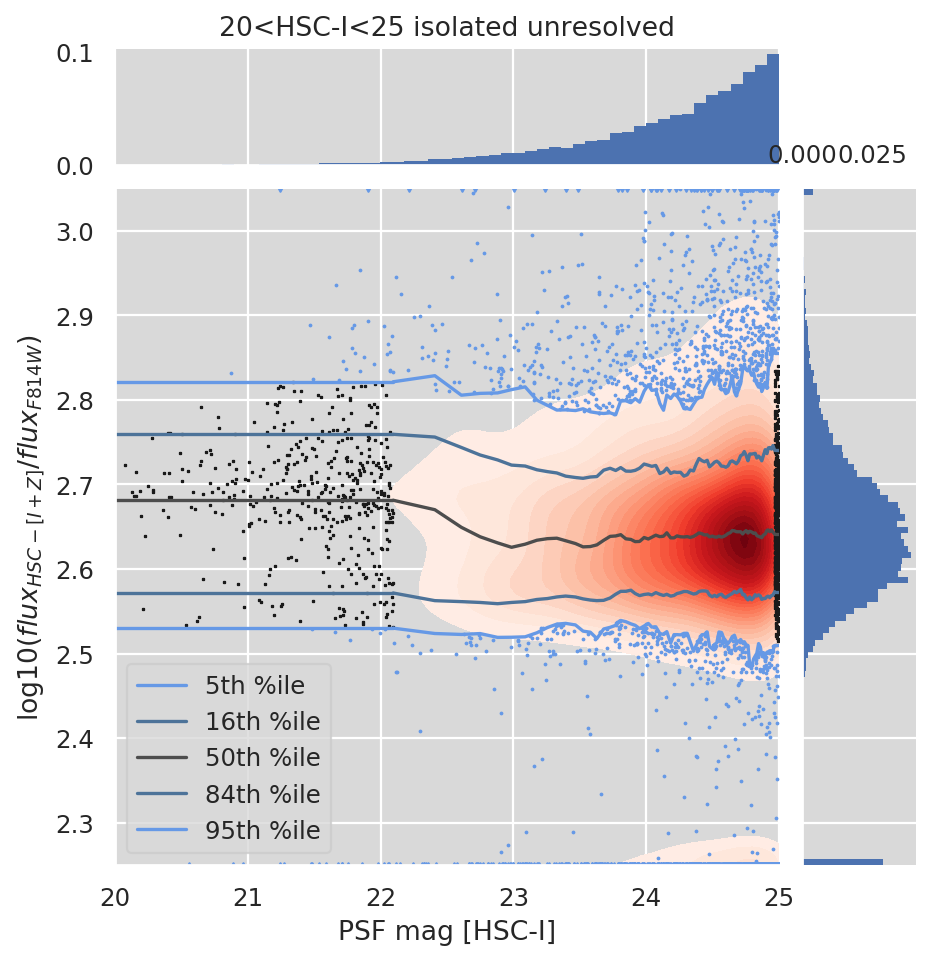

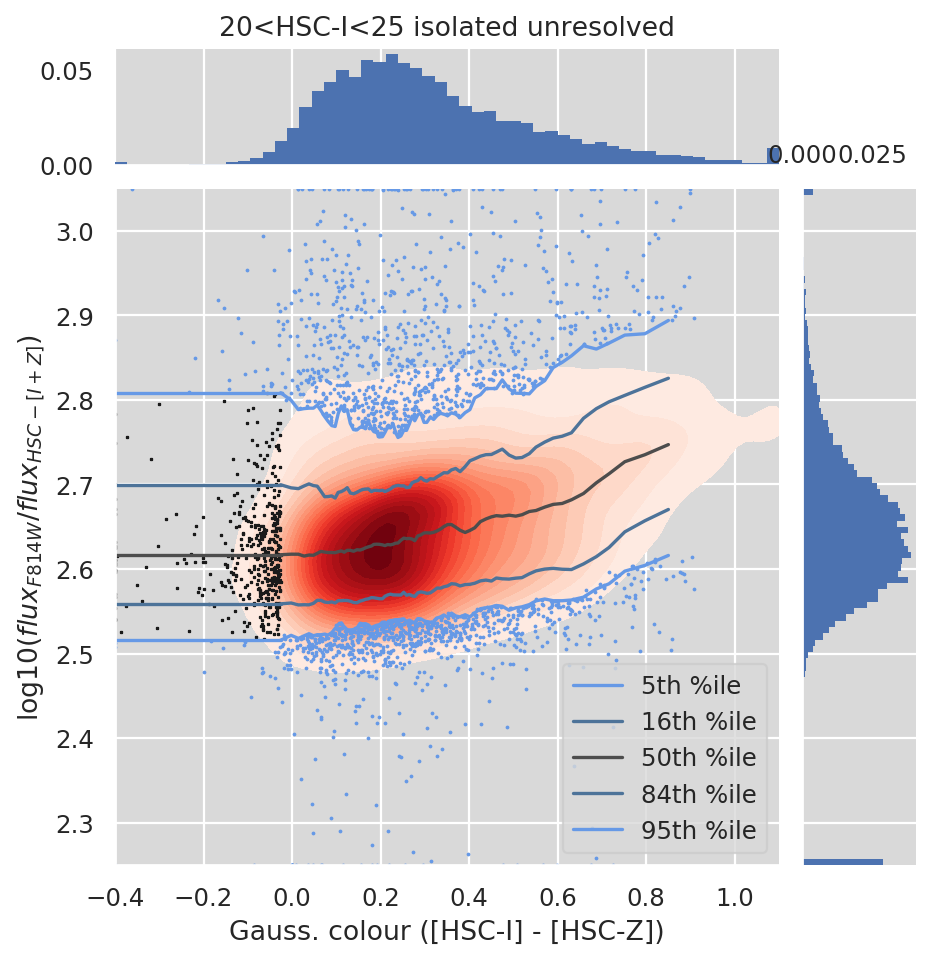

In [7]:
# Plot colour-magnitude diagrams, which are hopefully a straight line since 
mag_lo, mag_hi = 20, 25
select_mag = (cat['base_PsfFlux_mag'] > mag_lo)*(cat['base_PsfFlux_mag'] < mag_hi)*~(cat['base_PixelFlags_flag_saturated'])
select_mag_iso = sample['isolated']*select_mag
data = cat[select_mag_iso]
data_hst = cat_hst[select_mag_iso]
flux_sample = []
sigma_sample = []
colour_sample = []
title_state = f'{mag_lo}<HSC-I<{mag_hi} isolated unresolved'
for (scale, sample_src, is_hst) in [(0.03, data_hst, True), (0.167, data, False)]:
    name_model = f'multiprofit_gausspx{"_no_psf" if is_hst else ""}'
    sigma = {k: sample_src[f'{name_model}_c1_sigma_{k}'] for k in ['x', 'y']}
    sigma = scale*np.sqrt(sigma['x']**2 + sigma['y']**2)
    sigma_sample.append(np.log10(sigma))
    bands = ['F814W'] if is_hst else ['HSC-I', 'HSC-Z']
    flux_band = {band: sample_src[f'{name_model}_c1_{band}_{name_flux(is_hst)}'] for band in bands}
    flux = np.zeros_like(sigma)
    for flux_band in flux_band.values():
        flux += flux_band
    flux[~(flux > 0)] = 0
    flux_sample.append(np.log10(flux))
    if not is_hst and (len(bands) > 1):
        mag_band = {band: sample_src[f'{name_model}_c1_{band}_mag'] for band in bands}
        colour = mag_band[bands[0]] - mag_band[bands[1]]
    else:
        colour = None
    colour_sample.append(colour)
within = sigma_sample[0] < sigma_max
limy = (2.25, 3.05)
y = flux_sample[1][within]-flux_sample[0][within]
g = plotjoint_running_percentiles(
    data[within]['base_PsfFlux_mag'], y,
    limx=(mag_lo, mag_hi), limy=limy,
    labelx='PSF mag [HSC-I]', labely='log10($flux_{HSC-[I+Z]}$/$flux_{F814W}$)',
    **argspj)
g.ax_marg_x.set_title(title_state)
limx=(-0.4, 1.1)
g = plotjoint_running_percentiles(
    np.clip(colour_sample[1][within], limx[0], limx[1]), y,
    limx=limx, limy=limy,
    labelx='Gauss. colour ([HSC-I] - [HSC-Z])', labely='log10($flux_{F814W}$/$flux_{HSC-[I+Z]}$)',
    **argspj)
g.ax_marg_x.set_title(title_state)

## Visually inspecting discrepancies

Here we plot relatively bright, isolated sources (i < 23) which have inconsistent classifications, i.e. base_ClassificationExtendedness_value != sigma_hst > sigma_max. These are generally:
- HSC failed blends, which are classified as extended but actually a point source + other sources in HST (they're not actually isolated);
- HST successful fits that are slightly larger than sigma_max for no obvious reason;
- HST failed fits with nan sigma, again for no obvious reason.

In [8]:
# Load the Butler for the latest HSC re-run, and all of the overlapping COSMOS HST images
butler = Butler("/datasets/hsc/repo/rerun/RC/w_2019_38/DM-21386/")
ra_range, dec_range = [(np.nanmin(x)*rad2deg, np.nanmax(x)*rad2deg) for x in [cat[f'coord_{y}'] for y in ['ra', 'dec']]]
tiles = get_tiles_HST_COSMOS()
tiles = get_tiles_overlapping_HST(ra_range, dec_range, tiles)
exposures_hst = get_exposures_HST_COSMOS(ra_range, dec_range, tiles, "/project/dtaranu/cosmos/hst/COSMOS_25.2_training_sample")
calexps = {}
meas = {}

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/astropy/table/column.py:1020: RuntimeWarning: invalid value encountered in less
  result = getattr(super(), op)(other)


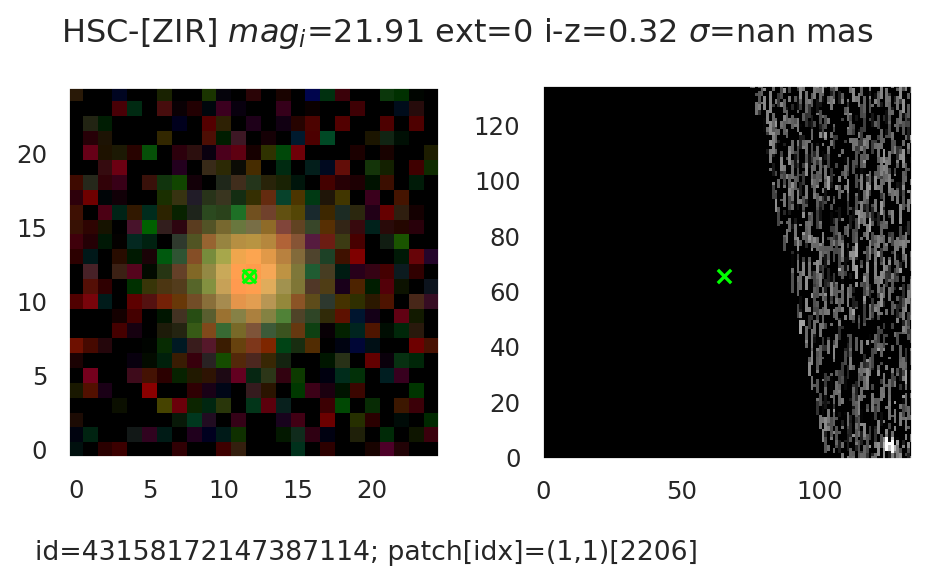

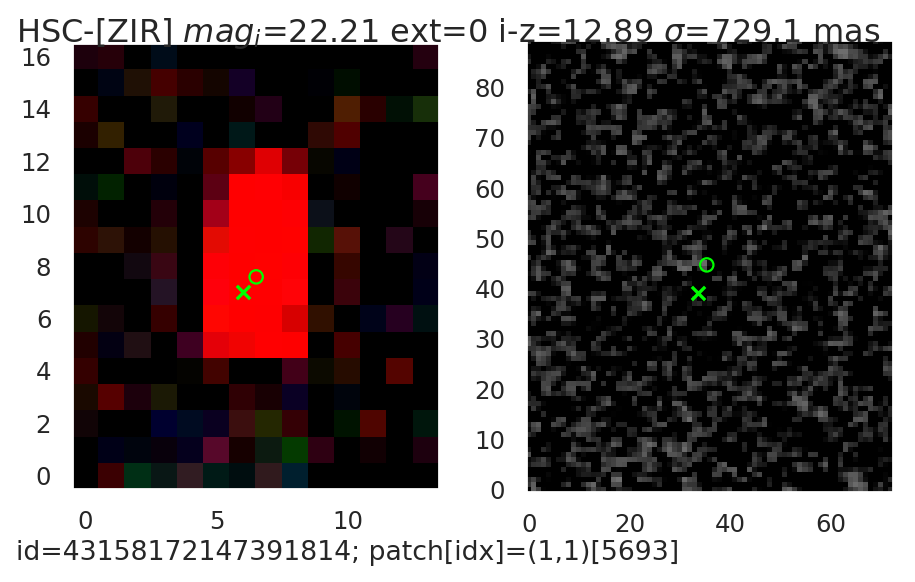

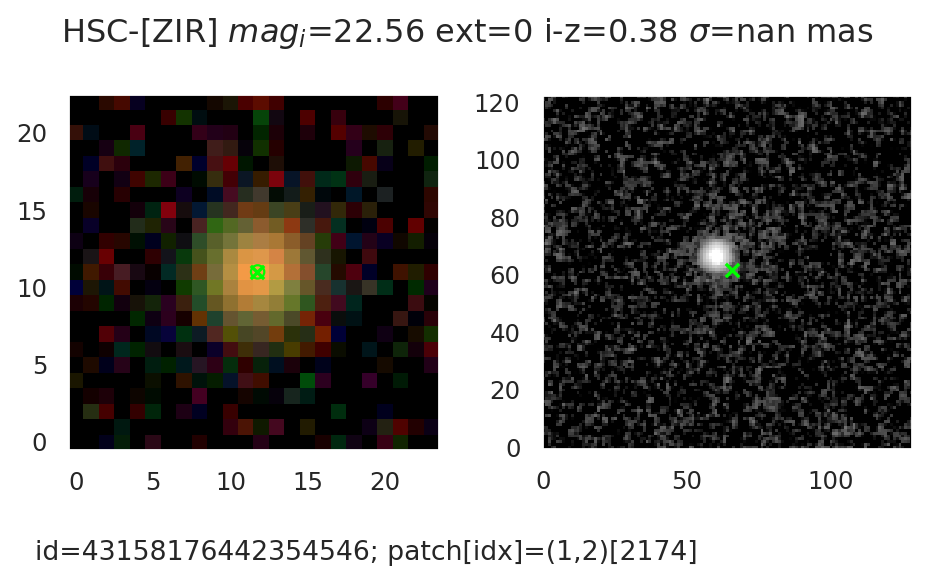

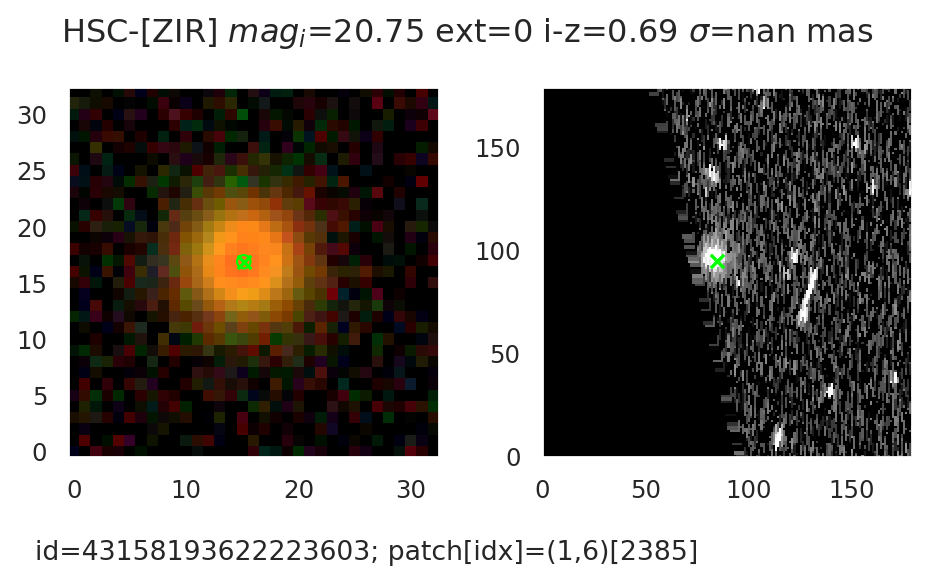

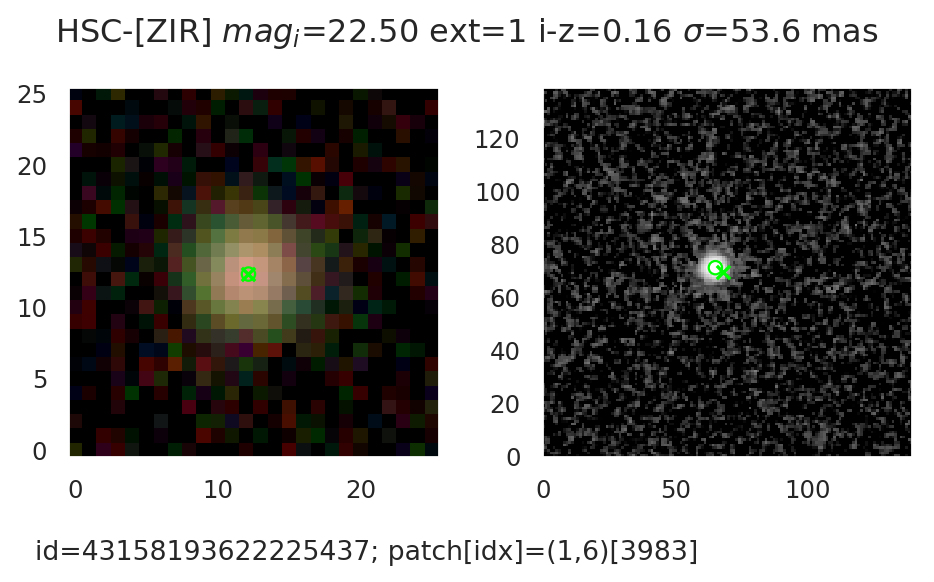

...

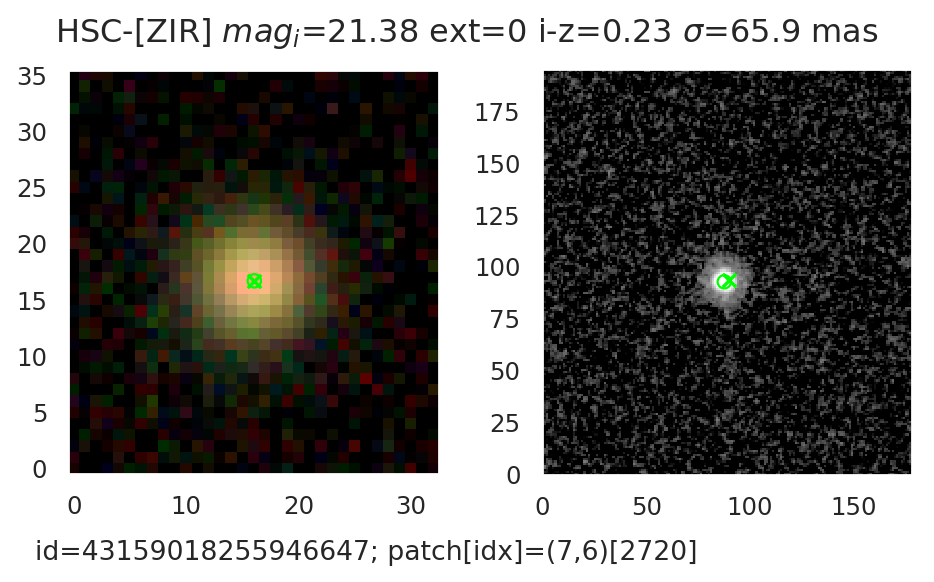

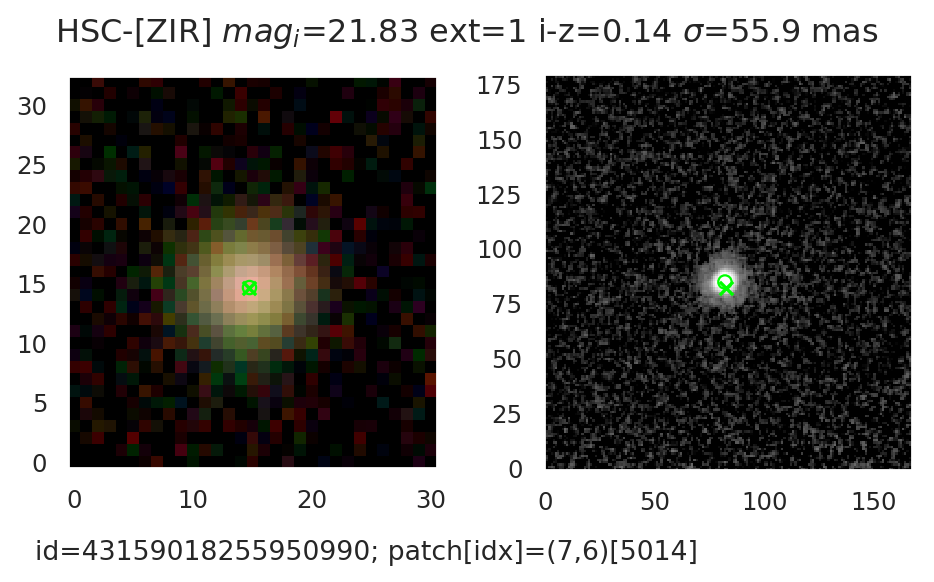

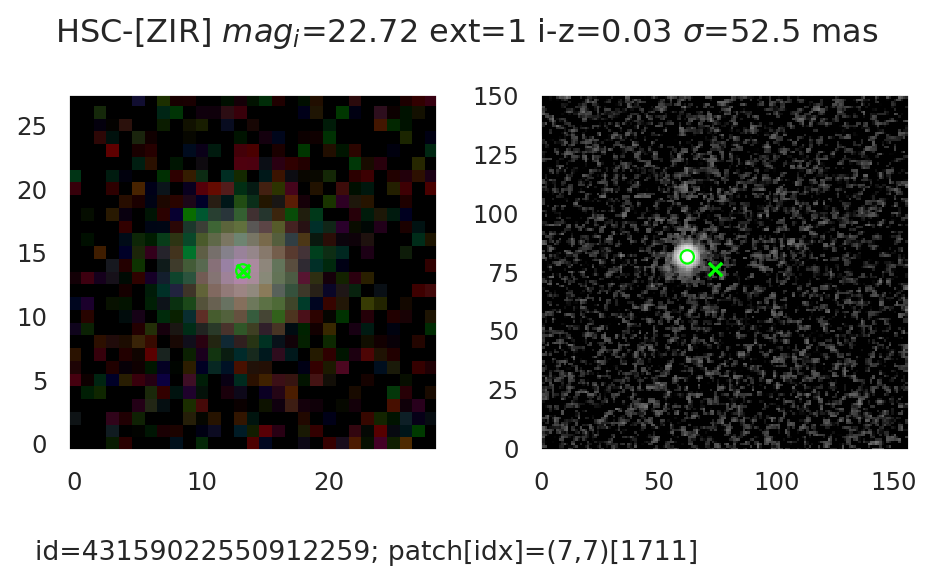

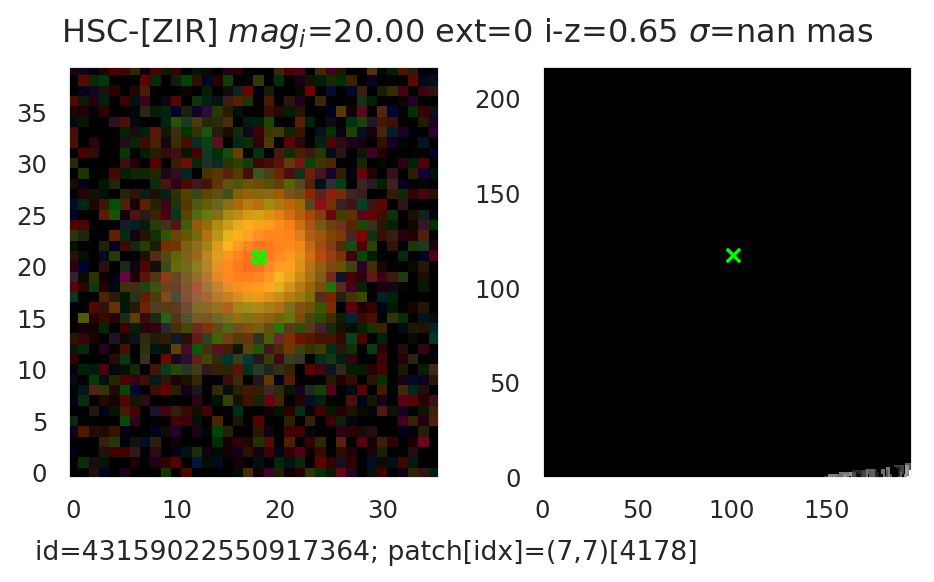

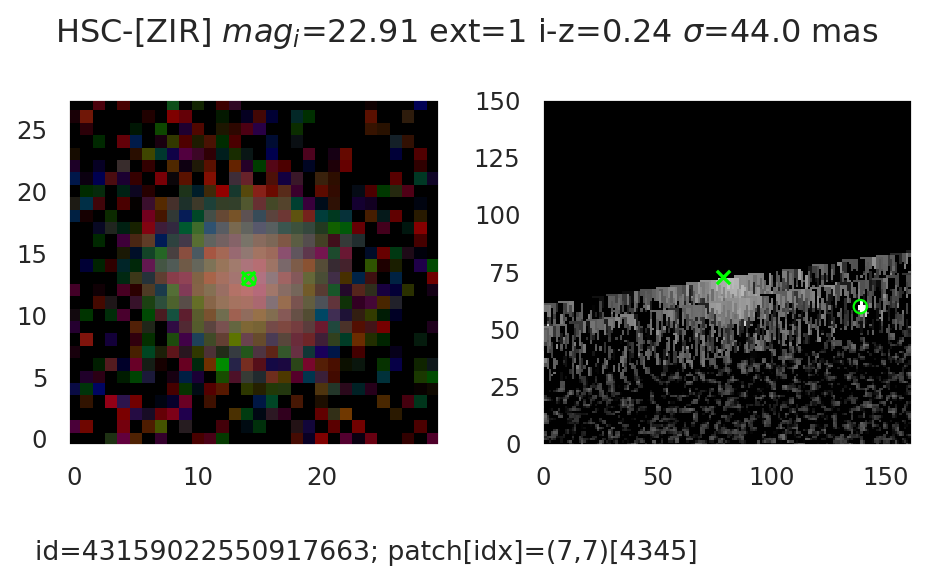

In [9]:
# Show images of sources that should all be isolated stars
sns.set_style("darkgrid", {'axes.grid' : False})
band = 'HSC-I'
bands = ['HSC-Z', 'HSC-I', 'HSC-R']
scale_hst2hsc = 0.168/0.03
tract = 9813
for mag_lo, mag_hi in [(14, 23)]: 
    select_mag = (cat['base_PsfFlux_mag'] > mag_lo) & (cat['base_PsfFlux_mag'] < mag_hi) & ~(cat['base_PixelFlags_flag_saturated'])
    rows = np.where(sample['isolated'] & select_mag)[0]
    data_hsc = cat[rows]
    data_hst = cat_hst[rows]
    sigma = {k: data_hst[f'multiprofit_gausspx_no_psf_c1_sigma_{k}'] for k in ['x', 'y']}
    sigma = 0.03*np.sqrt(0.5*(sigma['x']**2 + sigma['y']**2))
    unresolved = sigma < sigma_max
    rows_good = np.where(unresolved == data_hsc[col_extended])[0]
    for idx_good in rows_good:
        idx_row = rows[idx_good]
        row = data_hsc[idx_good]
        id_src = row['id']
        row_offset_idx = np.argmax(patch_rows >= idx_row)
        name_patch = patches[row_offset_idx]
        row_patch = int(idx_row - (0 if row_offset_idx == 0 else patch_rows[row_offset_idx-1]))
        # This doesn't always agree - not sure if that's because patches overlap?
        # patch = skymap.findPatch(SpherePoint(row['coord_ra'], row['coord_dec'], radians)).getIndex()
        if name_patch not in meas:
            meas[name_patch] = butler.get('deepCoadd_meas', {'filter': 'HSC-I', 'tract': tract, 'patch': name_patch})
        src = meas[name_patch][row_patch]
        if name_patch not in calexps:
            calexps[name_patch] = {band: butler.get('deepCoadd_calexp', {'filter': band, 'tract': tract, 'patch': name_patch}) for band in bands}
        calexps_patch = calexps[name_patch]
        wcs = calexps_patch['HSC-I'].getWcs()
        bbox = src.getFootprint().getBBox()
        cenx, ceny = src.getCentroid() - bbox.getBegin()
        radec = [[y for y in wcs.pixelToSky(Point2D(x)).getPosition(degrees)] for x in bbox.getCorners()]
        try:
            img = get_exposure_cutout_HST(radec, (0, 0), exposures_hst)[0].image
            sum_img = np.sum(img)
            if np.isfinite(sum_img) and sum_img != 0:
                fig, axes = plt.subplots(ncols=2)
                axes[0].imshow(make_lupton_rgb(*[x.image.subset(bbox).array for x in calexps_patch.values()], stretch=0.4, Q=8))
                axes[0].scatter(cenx, ceny, marker='x', color='lime')
                axes[0].scatter(data_hsc["multiprofit_gausspx_c1_cenx"][idx_good]-0.5, data_hsc["multiprofit_gausspx_c1_ceny"][idx_good]-0.5, marker='o', color='lime', facecolors='none')
                axes[1].imshow(make_lupton_rgb(img, img, img, stretch=0.01, Q=6))
                axes[1].scatter(cenx*scale_hst2hsc, ceny*scale_hst2hsc, marker='x', color='lime')
                axes[1].scatter(data_hst["multiprofit_gausspx_no_psf_c1_cenx"][idx_good]-0.5, data_hst["multiprofit_gausspx_no_psf_c1_ceny"][idx_good]-0.5, marker='o', color='lime', facecolors='none')
                plt.suptitle(
                    f'HSC-[ZIR] $mag_i$={data_hsc["base_PsfFlux_mag"][idx_good]:.2f} ext={int(data_hsc[col_extended][idx_good]==1)} '
                    f'i-z={data_hsc["multiprofit_gausspx_c1_HSC-I_mag"][idx_good] - data_hsc["multiprofit_gausspx_c1_HSC-Z_mag"][idx_good]:.2f} '
                    f'$\sigma$={1e3*sigma[idx_good]:.1f} mas', y=0.9
                )
                plt.figtext(0.05, 0.05, f'id={id_src}; patch[idx]=({name_patch})[{row_patch}]')
                plt.tight_layout()
                plt.show(block=False)
        except:
            pass
       
sns.set_style("darkgrid", {'axes.grid' : True})
                                  
plt.show()